# Detecting Engine Misfires with a smartphone

## What is a misfire?

When combustion does not correctly occur in a cylinder, it is known as a misfire. They can occur because of a fault with any of the three things needed for combustion to occur:

1. Fuel
2. Air
3. Spark

This makes diagnosing the issue quite difficult as all three sources have to be tested separately.

Misfires can occur intermittently or constantly. The type of misfire that occurs can often be of great help to a mechanic attempting to diagnose the source of the problem. Constant misfires are typically quite obvious to the driver. The engine can shake a lot, produce significantly less power and will sound rough. Common constant misfire causes can be diagnosed relatively easily.

Intermittent misfires are much harder to notice. Sometimes an engine may only misfire once over the course of several minutes. These kinds of subtle misfires are even more difficult to solve because of the lack of reproducible nature of the fault.

## How are misfires detected?

A constant misfire can be easily detected by sound, engine vibration and lack of power either by a mechanic or a vehicle owner. Most modern cars will accurately detect when engine misfires occur and produce an error code to validate the diagnosis. Some smarter vehicles will even tell you some of the causes of the misfire.

Older cars either cannot detect misfires or have poor implementations of misfire detection. The Engine Control Unit (ECU) detects misfires by observing anomalies in the crankshaft position. Most vehicles use a hall effect sensor placed near the flywheel to measure the crankshaft position. When a misfire occurs, the crankshaft speed reduces significantly for that stroke. The delta in speed can be detected by the ECU and an error code can be produced. However, many older cars (such as my 2002 Audi TT) have dubious implementations of this and very often don't detect the error at all. For example, on my Audi TT, I induced a constant misfire on several occassions and the ECU did not produce an engine fault code.

So, if you're lucky enough to have a modern car with high quality onboard diagnostics, the problem is probably easier to solve (although the method I discuss in this article could also be useful). If you're like me and are trying to maintain an older car that doesn't tell you what's wrong with it and don't want to have to replace the entire fuel, ignition and vacuum system, then read on.

### Using Audio Analysis

Some people (https://www.researchgate.net/publication/320616264_Engine_misfire_detection_with_pervasive_mobile_audio) have created implementations that use mobile audio by training a machine learning classifier on engine sounds with healthy engines and engines with induced misfires. It does require a bit of training data to build but it's super useful. It does only work with constant misfires though which are not difficult to notice in reality.

What's of more interest to me is detecting a niggling intermittent misfire. To do this, let's record some sample audio, do some analysis of it and see what we can find.

## The Dataset

We can obtain an intermittent misfire audio by:

1. Inducing an intermittent misfire - this requires you to quickly disconnect and reconnect a coil pack so that it only misfires a couple of times at most.
2. Recording a car with a "naturally occuring" intermittent misfire (which I'm lucky, or more probably, unlucky enough to have)

In the dataset, we're going to use both methods because they might be able to tell us more about the characteristics of the audio combined than individually.

In [9]:
# Only run this if you don't have a local copy of audio files.
!curl -L https://archive.org/download/04-tt-intermittent-misfire/04-tt-intermittent-misfire.wav --create-dirs -o ./files/audio/04-tt-intermittent-misfire.wav
!curl -L https://archive.org/download/04-tt-intermittent-misfire/04-tt-low-idle.wav --create-dirs -o ./files/audio/04-tt-low-idle.wav
!curl -L https://archive.org/download/04-tt-intermittent-misfire/No3-1.wav --create-dirs -o ./files/audio/No3-1.wav

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 3378k  100 3378k    0     0   400k      0  0:00:08  0:00:08 --:--:--  474k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
100 1758k  100 1758k    0     0   132k      0  0:00:13  0:00:13 --:--:--  198k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 3242k  100 3242k    0     0   154k      0  0:00:21  0:00:21 --:--:--  192k0  0:00:26  0:00:08  0:00:18  123k


In [75]:
import librosa

audio_path = './files/audio/'
files = ['04-tt-low-idle.wav', 'No3-1.wav', '04-tt-intermittent-misfire.wav']
#files = ['02-rough-cold-start-end.wav']

file_samples = []
file_sample_rates = []

sr = 48000

for file in files:
    samples, sample_rate = librosa.load(audio_path + file, sr=sr, mono=True, offset=0, duration=None)
    file_samples.append(samples)
    file_sample_rates.append(sample_rate)

### Normal Idle

To begin, let's listen to a recording of the car idling normally. This recording was taken on an iPhone with the bonnet of the car open, about 0.5m from the engine.

In [48]:
import IPython

IPython.display.Audio(audio_path + files[0])

Let's plot a Fast Fourier Transform (FFT) of the audio signal and see what spectral components are present in the signal.

In [49]:
from scipy.fft import fft, fftfreq
import matplotlib.pyplot as plt
import numpy as np

def fft_plot(samples, sample_rate, min_freq=0, max_freq=300, figsize=(14, 3)):
    yf = fft(samples)
    xf = fftfreq(len(samples), d=1/sample_rate)[:len(samples)//2]
    
    plt.figure(figsize=figsize)
    plt.title("FFT")
    
    plt.plot(xf, np.abs(yf[0:len(samples)//2]))
    
    plt.xlim(min_freq, max_freq)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Amplitude")

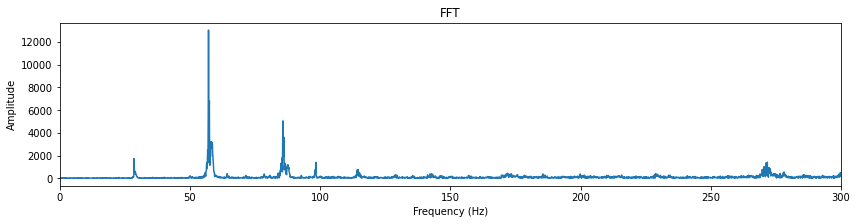

In [50]:
fft_plot(file_samples[0], file_sample_rates[0])

The most prominent frequencies in the FFT are about 56Hz, 28Hz and 84Hz. So what are these frequencies? Turns out that they are they fundamental frequency, 2nd and 3rd harmonics respectively of the engine rotating.

How did I figure that out? Well I know from the cars tachometer that the engine was idling at 820RPM, or in other words, 13.6 revolutions per second (13.6Hz). The inline-four cylinder engine completes a rotation of the crankshaft every two strokes. This means that the engine completes a stroke at $13.6 \cdot 2 = 27.2Hz$. That means 54.4Hz and 81.6Hz should be the 2nd and 3rd harmonics. That matches up pretty well with the frequencies seen in the FFT.

### Constant Misfire Idle

Now let's see what happens to the frequency domain when the engine starts misfiring.

In [51]:
IPython.display.Audio(audio_path + files[1])

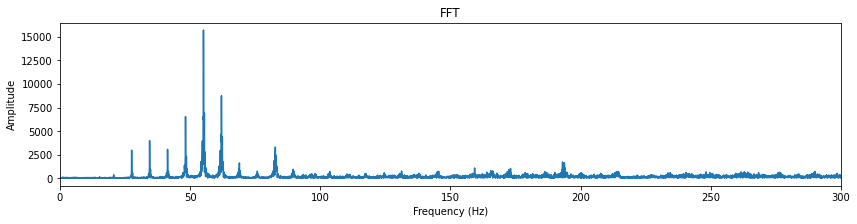

In [57]:
fft_plot(file_samples[1], file_sample_rates[1])

There's definitely a noticeable difference in the spectral components, particularly in the presence of inharmonic overtones that occur between the engine stroke harmonics. This is a very useful feature for detecting a misfiring engine.

Next let's look at intermittent misfires.

### Intermittent Misfire Idle

In [63]:
IPython.display.Audio(audio_path + files[2])

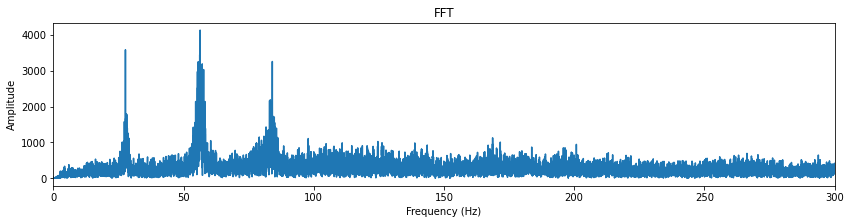

In [64]:
fft_plot(file_samples[2], file_sample_rates[2])

This audio recording was created by disconnecting one of the coilpack wires for a very short period of time and reconnecting it. This was repeated several times over the course of 30 seconds. The result is a much noisier signal caused by frequency artifacts of the misfires.

One possible naive approach could be to find some kind of metric to describe the noise found across the FFT such as an average frequency amplitude. However, there may be many causes of this noise in the FFT signal such as wind noise or other background noise.

#### Spectrogram

A temporal domain can be added to better visualise the points at which the intermittent misfires occur, by using a spectrogram. An FFT is calculated for a small window of time e.g. 0.1s and each FFT is displayed as a heatmap. This will help to identify the points in which the misfires occur.

In [81]:
from librosa import display

def stft_plot(samples, sample_rate, n_fft, hop_length,
              min_freq=0, max_freq=150, figsize=(14, 4)):
    stft = librosa.stft(samples, n_fft=sample_rate, window='hann',
                        hop_length=hop_length)
    
    plt.figure(figsize=figsize)
    
    plt.title("STFT")
    display.specshow(librosa.amplitude_to_db(stft), sr=sample_rate,
                     hop_length=hop_length, x_axis='time', y_axis='linear')
    plt.ylim(min_freq, max_freq)

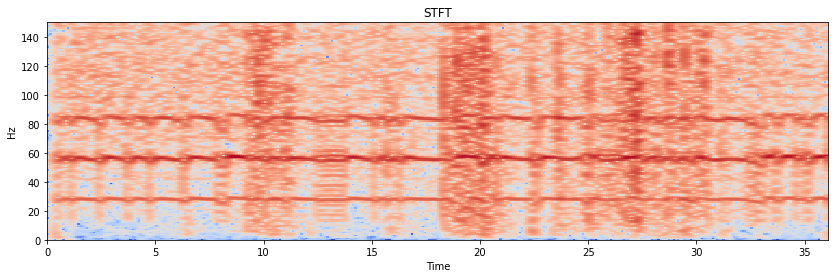

In [82]:
stft_plot(file_samples[2], file_sample_rates[2], file_sample_rates[2],
          hop_length=file_sample_rates[2]//10)

For comparison, let's also have a look at the spectrograms of no misfires and constantly misfiring engines.

No misfire


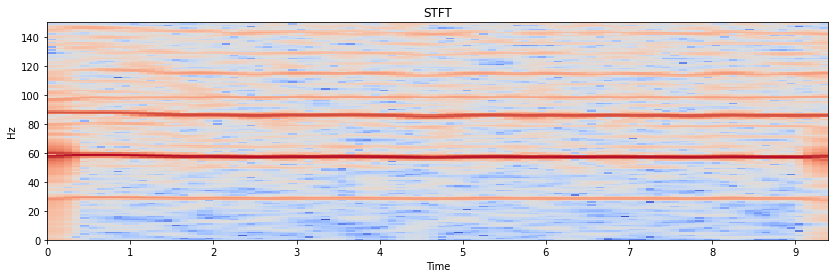

In [83]:
print("No misfire")
stft_plot(file_samples[0], file_sample_rates[0], file_sample_rates[0],
          hop_length=file_sample_rates[0]//10)

Constant misfire


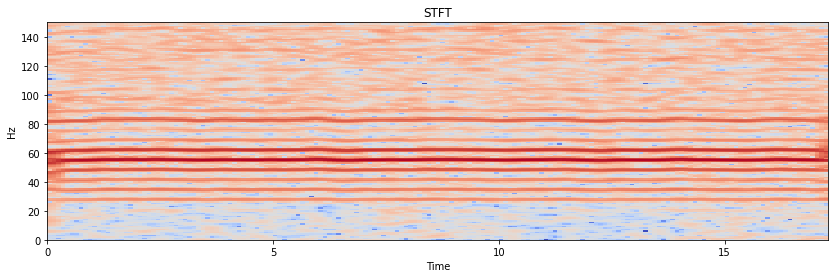

In [85]:
print("Constant misfire")
stft_plot(file_samples[1], file_sample_rates[1], file_sample_rates[1],
          hop_length=file_sample_rates[1]//10)

There are some very clear differences between the spectrograms. The engine operating normally contains very clear harmonic frequency components corresponding to the RPM of the engine. Similarly, the constant misfires contains very clear inharmonic RPM frequency components.

When intermittent misfires occur, there is definitely a change in the spectrogram, although it is less clear. There is a sudden drop in RPM and inharmonic components can start to be visible. I would characterise the changes as an engine frequency drop and a momentary increase in cross frequency spectrum noise in the region.

Let's see if we can detect it!

## Detecting 🕵️‍♀️

The first thing is to get a good reading of the RPM. This might seem easy at first glance, but it's much more difficult to do in practice. This is because, although the fundamental frequency is present in the audio sample we're working with, because of its low frequency, it may not be possible to pick it up with some smartphone microphones. We're going to have to try to infer the frequency of the engine from the presence of its harmonic components.

For background to the approach I'm going to use, I would highly recommend giving [this wiki](https://en.wikipedia.org/wiki/Missing_fundamental) on missing fundamental frequencies a read. It gives a lot of the theory about when they occur and some insight into how humans naturally infer non-existent fundamentals (more on that [here](http://www.brainmusic.org/MBB91%20Webpage/Pitch_II_Cariani.pdf)).

### Frequency Estimation

Estimating the RPM of the engine is essentially a frequency estimation problem. Frequency estimation is of interest to many different fields such as wireless communications, signal processing, speech processing and more. As a result, it is a mature field of research with many proposed solutions.

The problem of finding engine RPM requires the FE method to be good at finding missing fundamentals, be able to detect low frequencies and to be relatively good at finding the fundamental in a noisy signal capturing multiple sources.

There are several approaches that we can try and compare on our dataset to see how each performs.

__Preprocessing__

An engine sound is a complex signal consisting of many different source signals. In order to identify the engine RPM signal, a low pass filter is required to be applied.

In [90]:
import scipy

def band_pass_filter(signal, sample_rate, lowcut, highcut, order=2):
    nyq = 0.5 * sample_rate
    low = lowcut / nyq
    high = highcut / nyq

    b, a  = scipy.signal.butter(order, [low, high], 'bandpass', analog=False)
    return scipy.signal.filtfilt(b, a, signal, axis=0)

In [91]:
file_samples_lp = []

for s, fs in zip(file_samples, file_sample_rates):
    file_samples_lp.append(band_pass_filter(s, fs, 5, 150))

__1. Zero Crossings__

In [101]:
from libs.frequency_estimator import freq_from_crossings

zero_crossing_f = []

for s, fs in zip(file_samples_lp, file_sample_rates):
    zero_crossing_f.append(freq_from_crossings(s, fs))
    
zero_crossing_f

[57.615562601571476, 55.68836894219095, 69.91502781878046, 88.83234789471936]

__2. Fast Fourier Transform (FFT)__

In [102]:
from libs.frequency_estimator import freq_from_fft

fft_f = []

for s, fs in zip(file_samples_lp, file_sample_rates):
    fft_f.append(freq_from_fft(s, fs))
    
fft_f

[57.16455551345231, 55.20078243835123, 56.399092186247906, 85.59662945540614]

__3. Autocorrelation__

In [103]:
from libs.frequency_estimator import freq_from_autocorr

autocorr_f = []

for s, fs in zip(file_samples_lp, file_sample_rates):
    autocorr_f.append(freq_from_autocorr(s, fs))
    
autocorr_f

[28.709931639734858, 6.895523190710843, 27.95288142973118, 42.80335573435559]

__4. Harmonic-Percussive Separation (HPS)__

Pass 2: 57.162435 Hz
Pass 3: 28.571951 Hz
Pass 4: 28.575043 Hz
Pass 5: 14.334961 Hz
Pass 6: 5.672225 Hz
Pass 7: 0.963220 Hz


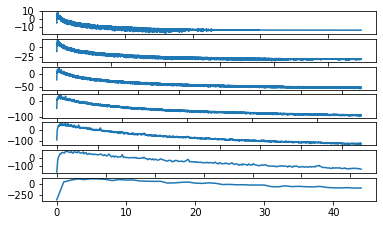

Pass 2: 55.201938 Hz
Pass 3: 27.593042 Hz
Pass 4: 27.586515 Hz
Pass 5: 6.895512 Hz
Pass 6: 6.895527 Hz
Pass 7: 1.738368 Hz


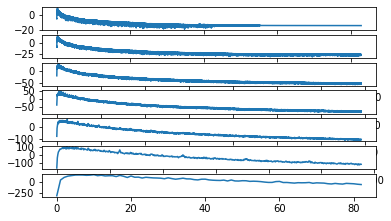

Pass 2: 56.399674 Hz
Pass 3: 27.730329 Hz
Pass 4: 28.026472 Hz
Pass 5: 6.936854 Hz
Pass 6: 2.784437 Hz
Pass 7: 1.387206 Hz


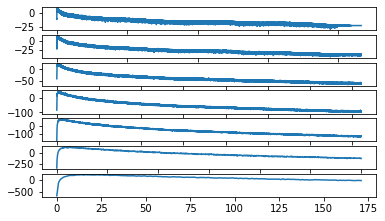

Pass 2: 85.596770 Hz
Pass 3: 42.665670 Hz
Pass 4: 42.768479 Hz
Pass 5: 21.396837 Hz
Pass 6: 4.299875 Hz
Pass 7: 1.433333 Hz


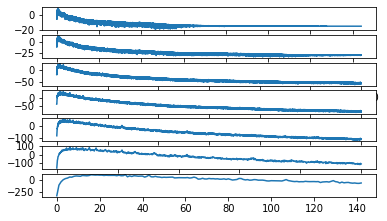

In [104]:
from libs.frequency_estimator import freq_from_HPS

for s, fs in zip(file_samples_lp, file_sample_rates):
    freq_from_HPS(s, fs)